**Воробьев Сергей** \\
Тема: Генерация изображений, активирующих конкретный нейрон, карту, слой \\
Задача: Добиться качественного изображения, перебрать архитектуры

Общую идею и часть кода я взял [отсюда](https://medium.com/analytics-vidhya/deep-dream-visualizing-the-features-learnt-by-convolutional-networks-in-pytorch-b7296ae3b7f).

Для генерации таких изображений будем пользоваться методом "activation-maximization". Его суть в том, чтобы взять картинку из случайного шума и неоднократно прогнать ее через сеть, выбрав какую-то конкретную область (слой, канал, нейрон). Максимизируя выход этой области мы будем каждый раз немного изменять картинку и получать требуемый результат.

Воспользуемся также полезным приемом: будем на каждом шаге слегка увеличивать нашу картинку. Это позволяет получать более мелкие паттерны и уменьшать шум. Идея [отсюда](https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030).



In [ ]:
from collections.abc import Sequence
import numpy as np
import torch
import torch.nn as nn
from torch.nn import functional as F
from tqdm import tqdm

In [ ]:
import copy
import cv2
import matplotlib.cm as cm
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import models, transforms

In [ ]:
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import os, sys

## Алгоритм

### RGBgradients

Класс, который будет отвечать за градиенты по каналам RGB по x и у. Его можно сделать, создав слой свертки с фильтрами Собеля или фильтрами Шарра. Этот класс нужен нам, чтобы штрафовать резкие изменения в генерируемой картинке.

In [ ]:
class RGBgradients(nn.Module):
    def __init__(self, weight): # weight is a numpy array
        super().__init__()
        k_height, k_width = weight.shape[1:]
        # assuming that the height and width of the kernel are always odd numbers
        padding_x = int((k_height-1)/2)
        padding_y = int((k_width-1)/2)
        
        # convolutional layer with 3 in_channels and 6 out_channels 
        # the 3 in_channels are the color channels of the image
        # for each in_channel we have 2 out_channels corresponding to the x and the y gradients
        self.conv = nn.Conv2d(3, 6, (k_height, k_width), bias = False, 
                              padding = (padding_x, padding_y) )
        # initialize the weights of the convolutional layer to be the one provided
        # the weights correspond to the x/y filter for the channel in question and zeros for other channels
        weight1x = np.array([weight[0], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # x-derivative for 1st in_channel
        
        weight1y = np.array([weight[1], 
                             np.zeros((k_height, k_width)), 
                             np.zeros((k_height, k_width))]) # y-derivative for 1st in_channel
        
        weight2x = np.array([np.zeros((k_height, k_width)),
                             weight[0],
                             np.zeros((k_height, k_width))]) # x-derivative for 2nd in_channel
        
        weight2y = np.array([np.zeros((k_height, k_width)), 
                             weight[1],
                             np.zeros((k_height, k_width))]) # y-derivative for 2nd in_channel
        
        
        weight3x = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)),
                             weight[0]]) # x-derivative for 3rd in_channel
        
        weight3y = np.array([np.zeros((k_height, k_width)),
                             np.zeros((k_height, k_width)), 
                             weight[1]]) # y-derivative for 3rd in_channel
        
        weight_final = torch.from_numpy(np.array([weight1x, weight1y, 
                                                  weight2x, weight2y,
                                                  weight3x, weight3y])).type(torch.FloatTensor)
        
        if self.conv.weight.shape == weight_final.shape:
            self.conv.weight = nn.Parameter(weight_final)
            self.conv.weight.requires_grad_(False)
        else:
            print('Error: The shape of the given weights is not correct')
    
    # Note that a second way to define the conv. layer here would be to pass group = 3 when calling torch.nn.Conv2d
    
    def forward(self, x):
        return self.conv(x)

In [ ]:
filter_x = np.array([[-3, 0, 3], 
                     [-10, 0, 10],
                     [-3, 0, 3]])
filter_y = filter_x.T
grad_filters = np.array([filter_x, filter_y])
gradLayer = RGBgradients(grad_filters)

In [ ]:
gradLayer = RGBgradients(grad_filters)

### Вспомогательные функции

In [ ]:
def get_device(cuda):
    cuda = cuda and torch.cuda.is_available()
    device = torch.device("cuda" if cuda else "cpu")
    if cuda:
        current_device = torch.cuda.current_device()
        print("Device:", torch.cuda.get_device_name(current_device))
    else:
        print("Device: CPU")
    return device

In [ ]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

denormalize = transforms.Normalize(mean = [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                                   std = [1/0.229, 1/0.224, 1/0.225] )

In [ ]:
def grad_loss(img, beta = 1, device = 'cpu'):
    
    # move the gradLayer to cuda
    gradLayer.to(device)
    gradSq = gradLayer(img.unsqueeze(0))**2
    
    grad_loss = torch.pow(gradSq.mean(), beta/2)
    
    return grad_loss

In [ ]:
def random_image(Height = 28, Width = 28, device = 'cpu', requires_grad=False, optimizer=None, lr = 0.01):
    img = np.single(np.random.uniform(0,1, (3, Height, Width))) # we need the pixel values to be of type float32
    im_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(requires_grad) # normalize the image to have requisite mean and std.
    print("img_shape:{}, img_dtype: {}".format(im_tensor.shape, im_tensor.dtype ))
    
    if optimizer:
        if requires_grad:
            return im_tensor, optimizer([im_tensor], lr = lr)
        else: 
            print('Error: Optimizer cannot be used on an image without setting its requires_grad_  ')
    
    return im_tensor

In [ ]:
def image_converter(im):
    im_copy = im.cpu()
    im_copy = denormalize(im_copy.clone().detach()).numpy()
    im_copy = im_copy.transpose(1,2,0)
    im_copy = im_copy.clip(0, 1) 
    
    return im_copy

Будем отслеживать значения на выходе слоев с помощью PyTorch hooks.

In [ ]:
activation = {}
def create_hook(name):
    def hook(m, i, o):
        # copy the output of the given layer
        activation[name] = o
    return hook

Ниже представлен алгоритм, который генерирует картинку. Во внешнем цикле `upscaling_steps` отвечает за количество увеличений картинки в `upscaling_factor` раз. Внутренний цикл по `optim_steps` отвечает за количество оптимизаций перед увеличением.

In [ ]:
def generate_img(model, im_tensor, layer, channel=None, neuron=None):
    model.eval()
    for mag_epoch in range(upscaling_steps+1):
        optimizer = torch.optim.Adam([im_tensor], lr = 0.4)
        
        for opt_epoch in range(optim_steps):
            optimizer.zero_grad()
            model(im_tensor.unsqueeze(0))
            layer_out = activation[f'hook{layer}']
            if not channel and not neuron:
                # rms = torch.pow((layer_out[0, :]**2).mean(), 0.5)
                rms = layer_out[0, :].norm()
            elif channel and not neuron:
                # rms = torch.pow((layer_out[0, channel]**2).mean(), 0.5)
                rms = layer_out[0, channel].norm()
            elif channel and neuron:
                if len(neuron) != 2:
                    raise TypeError
                # rms = torch.pow((layer_out[0, channel, neuron[0], neuron[1]]**2).mean(), 0.5)
                rms = layer_out[0, channel, neuron[0], neuron[1]].norm()
            # terminate if rms is nan
            if torch.isnan(rms):
                print('Error: rms was Nan; Terminating ...')
                raise TypeError
            
            # pixel intensity
            pxl_inty = torch.pow((im_tensor**2).mean(), 0.5)
            # terminate if pxl_inty is nan
            if torch.isnan(pxl_inty):
                print('Error: Pixel Intensity was Nan; Terminating ...')
                raise TypeError
                
            # image gradients
            im_grd = grad_loss(im_tensor, beta = 1, device = device)
            # terminate is im_grd is nan
            if torch.isnan(im_grd):
                print('Error: image gradients were Nan; Terminating ...')
                raise TypeError
            
            loss = -act_wt*rms + pxl_inty + im_grd        
            # print activation at the beginning of each mag_epoch
            # if opt_epoch == 0:
            #     print('begin mag_epoch {}, activation: {}'.format(mag_epoch, rms))
            loss.backward()
            optimizer.step()
            
        # view the result of optimising the image
        # print('end mag_epoch: {}, activation: {}'.format(mag_epoch, rms))
        img = image_converter(im_tensor)
        # plt.imshow(img)
        # plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
        # plt.show()
        
        img = cv2.resize(img, dsize = (0,0), 
                        fx = upscaling_factor, fy = upscaling_factor).transpose(2,0,1) # scale up and move the batch axis to be the first
        im_tensor = normalize(torch.from_numpy(img)).to(device).requires_grad_(True)

    img = image_converter(im_tensor)
    # plt.imshow(img)
    # plt.title('image at the end of mag_epoch: {}'.format(mag_epoch))
    # plt.show()
    return img

## Эксперименты

### VGG16

Для начала опробуем нашу генерацию на простых сетях типа AlexNet и VGG16

In [ ]:
Height = 64
Width = 64

act_wt = 0.2 # factor by which to weigh the activation relative to the regulizer terms
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 50# no. of times to optimize an input image before upscaling

In [ ]:
model = models.vgg16(pretrained = True)
device = get_device(cuda=True)
model.to(device)

for param in model.parameters():
    param.requires_grad_(False)

Device: Tesla P100-PCIE-16GB


#### Конкретные слои

In [ ]:
layer_list = [3, 6, 11, 18, 22, 29]
act_wt_dict = {3: 0.4, 6: 0.45, 11: 0.5, 18: 0.3, 22: 0.3, 29: 0.4}
im_array = []
title_array = []

for n, layer in enumerate(layer_list):
    act_wt = act_wt_dict[layer]
    model.features[layer].register_forward_hook(create_hook(f'hook{layer}'))
    img = np.single(np.random.uniform(0,1, (3, Height, Width)))
    im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
    img = generate_img(model, im_tensor, layer)
    im_array.append(img)
    title_array.append(f'Image from layer {layer}')

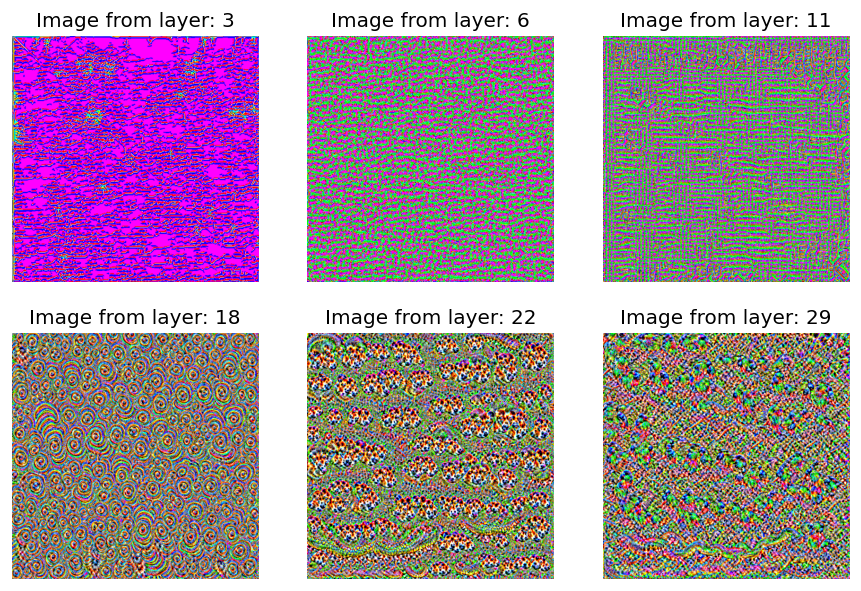

In [ ]:
ncols = 3
nrows = len(layer_list) // ncols + (len(layer_list) % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n])

#### Конкретные каналы

In [ ]:
layer_list = [6, 11, 18]
channel_list = [11, 20, 30]
im_array = []
title_array = []

for layer in layer_list:
    model.features[layer].register_forward_hook(create_hook(f'hook{layer}'))
    for channel in channel_list:
        img = np.single(np.random.uniform(0,1, (3, Height, Width)))
        im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
        img = generate_img(model, im_tensor, layer, channel)
        im_array.append(img)
        title_array.append(f'Image from layer {layer}\n channel {channel}')

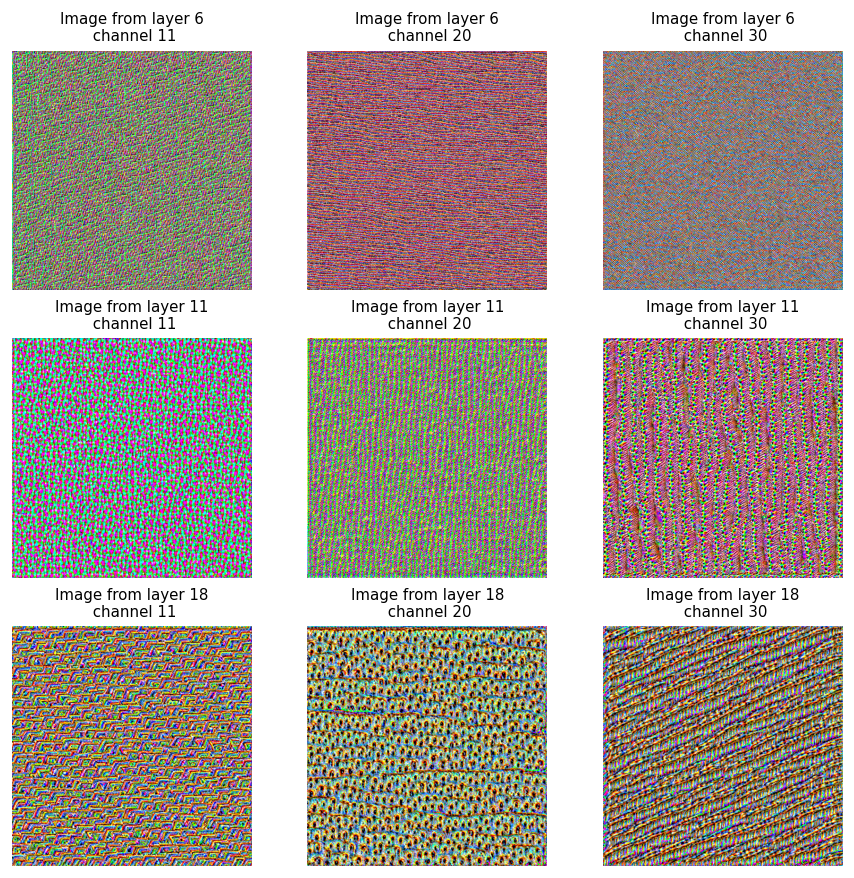

In [ ]:
ncols = 3
l = len(layer_list) * len(channel_list)
nrows = l // ncols + (l % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n], fontsize=9)

#### Конкретные пиксели

In [ ]:
upscaling_steps = 15
layer_list = [11, 18]
channel_list = [11]
neuron_list = [(1, 0), (7, 7)]
im_array = []
title_array = []

for layer in layer_list:
    model.features[layer].register_forward_hook(create_hook(f'hook{layer}'))
    for channel in channel_list:
        for neuron in neuron_list:
            img = np.single(np.random.uniform(0,1, (3, Height, Width)))
            im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
            img = generate_img(model, im_tensor, layer, channel, neuron)
            im_array.append(img)
            title_array.append(f'Image from layer {layer}\n channel {channel}, neuron {neuron}')

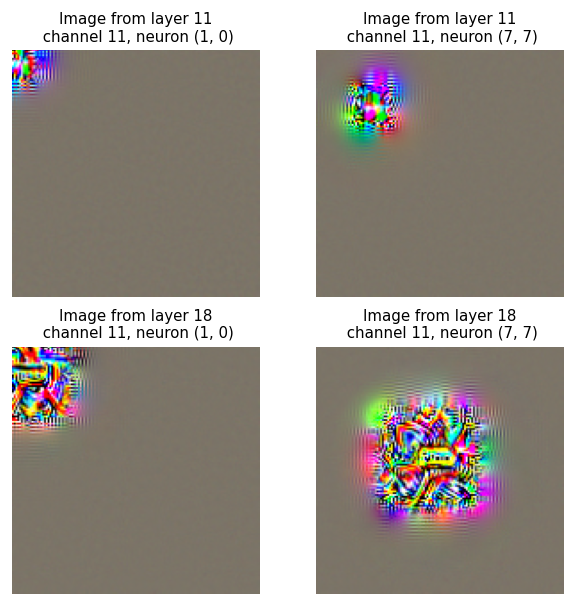

In [ ]:
ncols = 2
l = len(layer_list) * len(channel_list) * len(neuron_list)
nrows = l // ncols + (l % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n], fontsize=9)

### AlexNet

In [ ]:
Height = 128
Width = 128

act_wt = 0.5 # factor by which to weigh the activation relative to the regulizer terms
upscaling_steps = 25 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 50# no. of times to optimize an input image before upscaling

In [ ]:
model = models.alexnet(pretrained = True)
device = get_device(cuda=True)
model.to(device)

for param in model.parameters():
    param.requires_grad_(False)

Device: Tesla P100-PCIE-16GB


In [ ]:
model.features

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
)

#### Конкретные слои

In [ ]:
layer_list = [4, 7, 11]
im_array = []
title_array = []

for n, layer in enumerate(layer_list):
    model.features[layer].register_forward_hook(create_hook(f'hook{layer}'))
    img = np.single(np.random.uniform(0,1, (3, Height, Width)))
    im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
    img = generate_img(model, im_tensor, layer)
    im_array.append(img)
    title_array.append(f'Image from layer: {layer}')

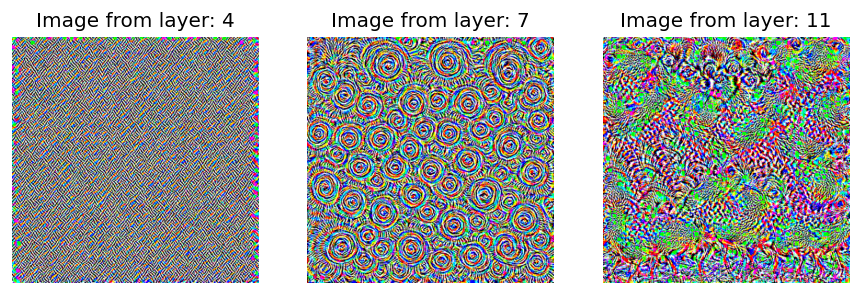

In [ ]:
ncols = 3
nrows = len(layer_list) // ncols + (len(layer_list) % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n])

#### Конкретные каналы

In [ ]:
layer_list = [4, 7, 11]
channel_list = [11, 20, 30]
im_array = []
title_array = []

for layer in layer_list:
    model.features[layer].register_forward_hook(create_hook(f'hook{layer}'))
    for channel in channel_list:
        img = np.single(np.random.uniform(0,1, (3, Height, Width)))
        im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
        img = generate_img(model, im_tensor, layer, channel)
        im_array.append(img)
        title_array.append(f'Image from layer {layer}\n channel {channel}')

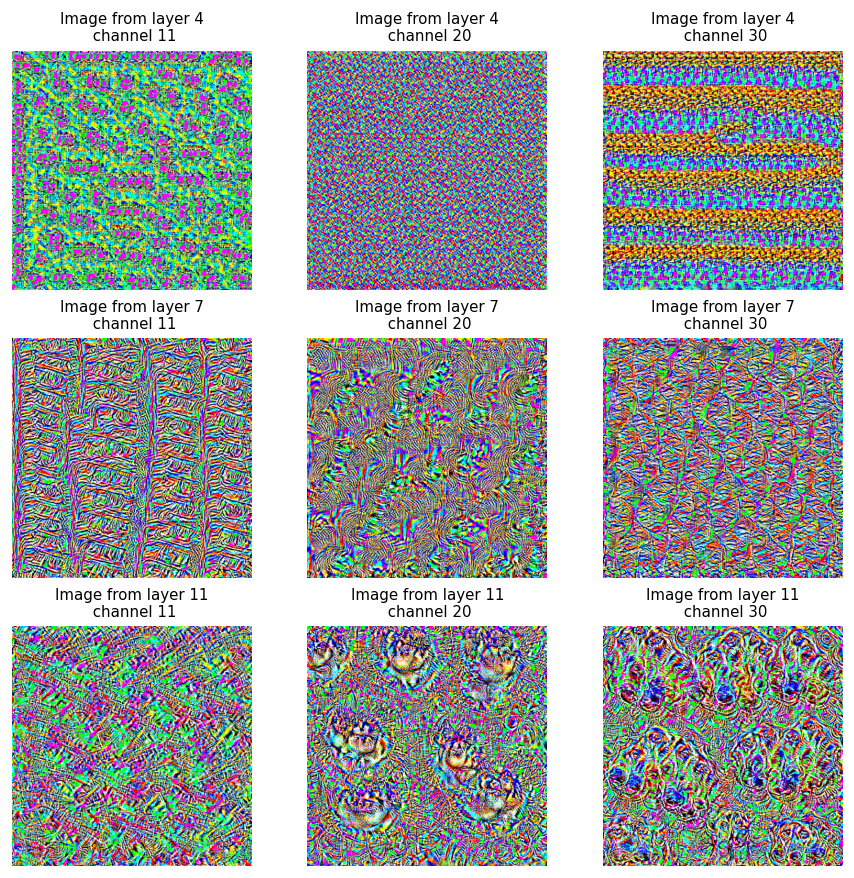

In [ ]:
ncols = 3
l = len(layer_list) * len(channel_list)
nrows = l // ncols + (l % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n], fontsize=9)

#### Конкретные пиксели

In [ ]:
layer_list = [4, 7, 11]
channel_list = [11]
neuron_list = [(4, 4), (1, 0), (0, 6)]
im_array = []
title_array = []

for layer in layer_list:
    model.features[layer].register_forward_hook(create_hook(f'hook{layer}'))
    for channel in channel_list:
        for neuron in neuron_list:
            img = np.single(np.random.uniform(0,1, (3, Height, Width)))
            im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
            img = generate_img(model, im_tensor, layer, channel, neuron)
            im_array.append(img)
            title_array.append(f'Image from layer {layer}\n channel {channel}, neuron {neuron}')

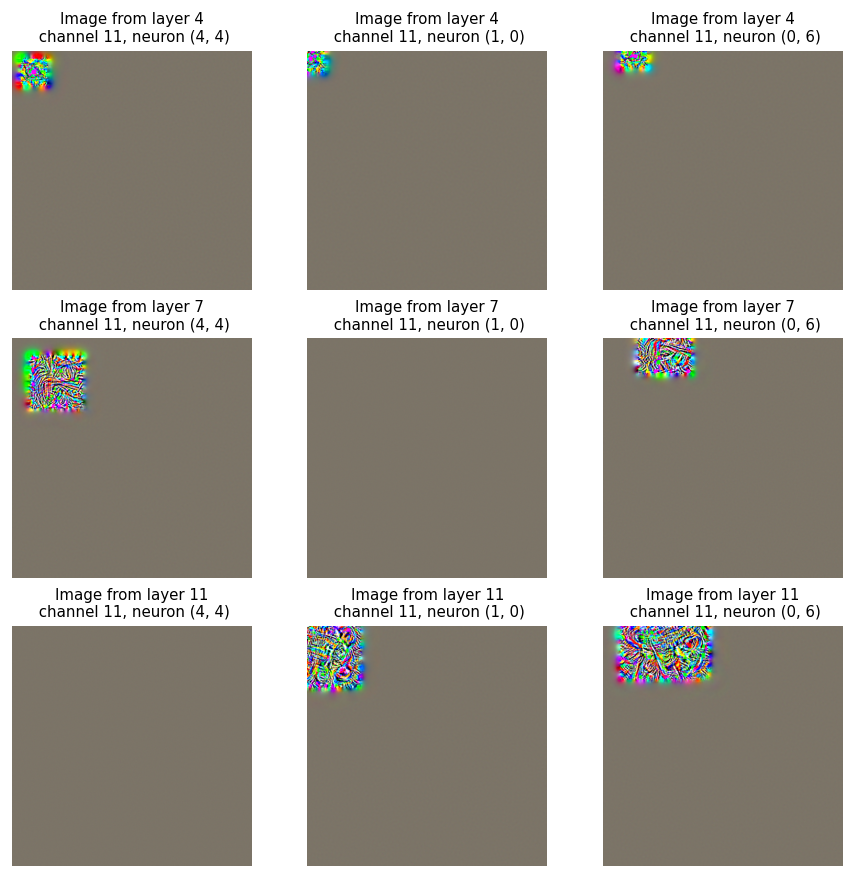

In [ ]:
ncols = 3
l = len(layer_list) * len(channel_list) * len(neuron_list)
nrows = l // ncols + (l % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n], fontsize=9)

**Выводы:**

1. Перебирая слои, мы можем заметить, как усложняются распознаваемые паттерны с углублением слоя. На первых слоях сеть распознает в основном простые линии и фигуры. На последних слоях можем заметить сложные паттерны на картинке. \\

2. За каналами внутри слоя тоже интересно наблюдать. Там встречаются разные паттерны из одного семейства или почти одинаковой сложности. \\

3. Можем заметить, что наблюдать за отдельными нейронами не очень инетересно. Они являются частью рисунков отдельных каналов \\

### GoogLeNet
Теперь попробуем посмотреть на изображения, получаемые с более сложной сетью.

In [ ]:
Height = 28
Width = 28
act_wt = 0.5

act_wt_dict = {'inception4a': 0.8, 'inception5a': 0.1} # factor by which to weigh the activation relative to the regulizer terms
upscaling_steps = 45 # no. of times to upscale
upscaling_factor = 1.05
optim_steps = 100# no. of times to optimize an input image before upscaling

In [ ]:
model = models.googlenet(pretrained = True)
device = get_device(cuda=True)
model.to(device)

for param in model.parameters():
    param.requires_grad_(False)

Device: Tesla P100-PCIE-16GB


In [ ]:
list(map(lambda x: x[0], model.named_children()))

['conv1',
 'maxpool1',
 'conv2',
 'conv3',
 'maxpool2',
 'inception3a',
 'inception3b',
 'maxpool3',
 'inception4a',
 'inception4b',
 'inception4c',
 'inception4d',
 'inception4e',
 'maxpool4',
 'inception5a',
 'inception5b',
 'avgpool',
 'dropout',
 'fc']

In [ ]:
layer_list = ['inception4a', 'inception5a']
model.inception4a.register_forward_hook(create_hook(f'hook{layer_list[0]}'))
model.inception5a.register_forward_hook(create_hook(f'hook{layer_list[1]}'))

channel_list = [8, 11, 22, 255]

im_array = []
title_array = []

for layer in layer_list:
    act_wt = act_wt_dict[layer]
    for channel in channel_list:
        img = np.single(np.random.uniform(0,1, (3, Height, Width)))
        im_tensor = normalize(torch.from_numpy(img).to(device)).requires_grad_(True)
        img = generate_img(model, im_tensor, layer, channel)
        im_array.append(img)
        title_array.append(f'Image from layer {layer}\n channel {channel}')

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


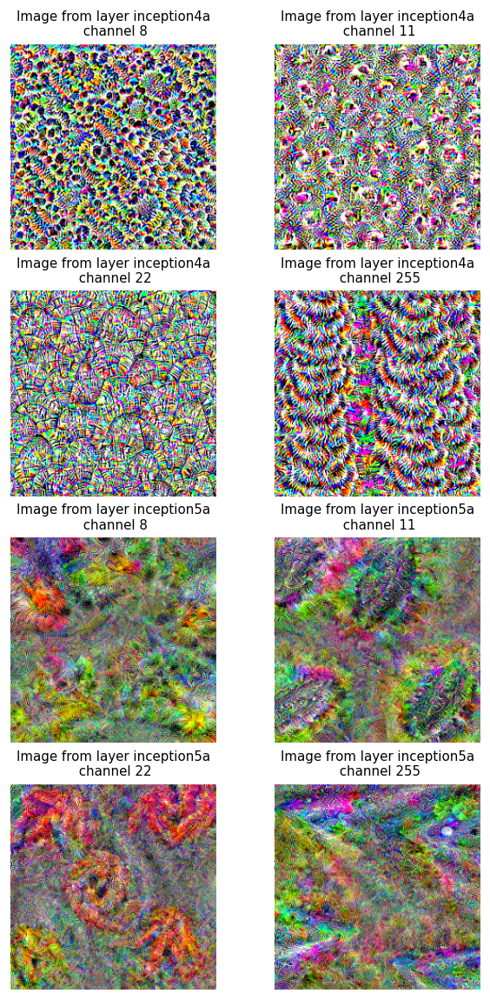

In [ ]:
ncols = 2
l = len(layer_list) * len(channel_list)
nrows = l // ncols + (l % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title_array[n], fontsize=9)

У кажого канала есть определенная уникальная структура и паттерны, которые он различает. Можем заметить, что изображения получились более сложными, однако, определить на них какой-то класс проблематично.

In [ ]:
!wget https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json

In [ ]:
import json
class_idx = json.load(open("imagenet_class_index.json"))
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


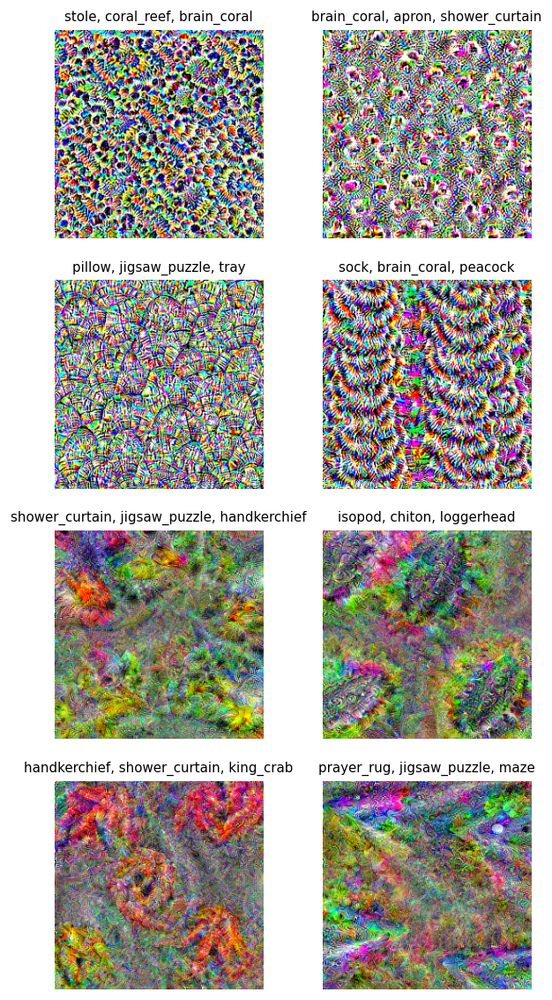

In [ ]:
ncols = 2
l = len(layer_list) * len(channel_list)
nrows = l // ncols + (l % ncols > 0)
plt.figure(figsize=(ncols * 3, nrows * 3), dpi=120)

for n, img in enumerate(im_array):
    input = torch.from_numpy(im_array[n].transpose(2,0,1)).unsqueeze(0).to(device)
    out = model(input)
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.imshow(img)
    ax.axis('off')
    labels = [idx2label[idx] for idx in out[0].sort()[1][-3:]]
    ax.set_title(', '.join(labels), fontsize=9)

После получения правильных ответов стало чуть проще разглядеть эти классы на картинках.